# EN3160 Assignment 1 on Intensity Transformations and Neighborhood Filtering

Instructed by Dr. Ranga Rodrigo

Done by: Warren Jayakumar

### Import Required Libraries

In [93]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [6]:
ASSET_FOLDER = 'a1images/'

### Implementing an Intensity Transformation Function

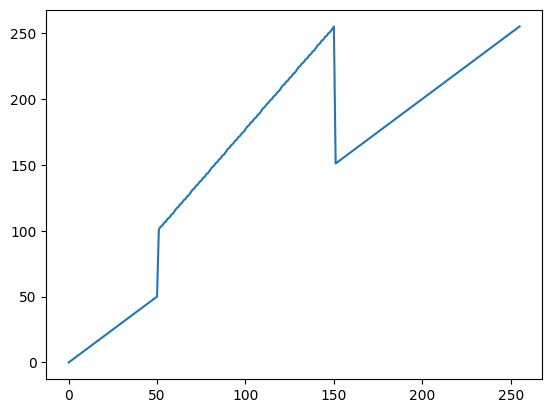

In [7]:
# Create the Function
discontinuities = np.array([(50, 50), (50, 100), (150, 255), (150, 150), (255, 255)])

# Segment-wise interpolation
t1 = np.linspace(0, discontinuities[0,1], discontinuities[0,0] + 1 - 0).astype('uint8')
t2 = np.linspace(discontinuities[0,1], discontinuities[1,1], discontinuities[1,0] - discontinuities[0,0] + 1).astype('uint8')
t3 = np.linspace(discontinuities[1,1], discontinuities[2,1], discontinuities[2,0] - discontinuities[1,0] + 1).astype('uint8')
t4 = np.linspace(discontinuities[2,1], discontinuities[3,1], discontinuities[3,0] - discontinuities[2,0] + 1).astype('uint8')
t5 = np.linspace(discontinuities[3,1], discontinuities[4,1], discontinuities[4,0] - discontinuities[3,0] + 1).astype('uint8')

# Concatenate all the segments
transform = np.concatenate([t1, t2[1:], t3[1:], t4[1:], t5[1:]])

plt.plot(transform)
plt.show()

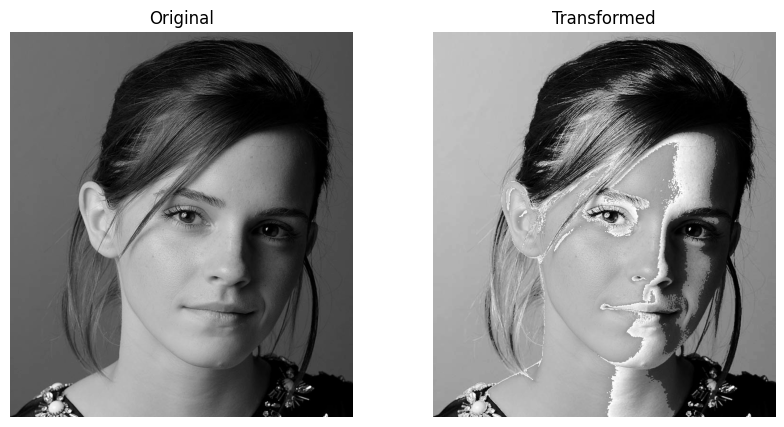

In [8]:
## Apply the transformation to the image
emma_watson = cv.imread(ASSET_FOLDER + 'emma.jpg', cv.IMREAD_GRAYSCALE)
emma_watson_transformed = cv.LUT(emma_watson, transform)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(emma_watson, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')
axes[1].imshow(emma_watson_transformed, cmap='gray')
axes[1].set_title('Transformed')
axes[1].axis('off')
plt.show()

### Enhancing White Matter and Grey Matter in an Image

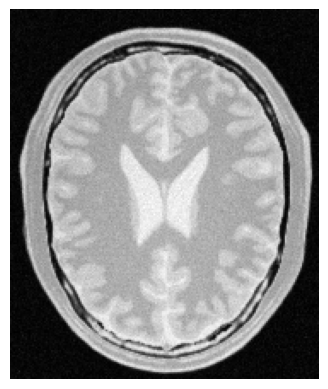

In [9]:
# View the original image
brain_image = ASSET_FOLDER + 'brain_proton_density_slice.png'
brain = cv.imread(brain_image, cv.IMREAD_GRAYSCALE)
plt.imshow(brain, cmap='gray')
plt.axis(False)
plt.show()

The white matter is brighter than the surrounding areas. Therefore, in order to enhance these areas, more detail can be brought out by increasing contrast in the brighter areas of the image. When considering the greymatter, it is darker than the white matter. Therefore, in order to enhance these areas, more detail can be brought out by increasing contrast in the medium intensity areas of the image.

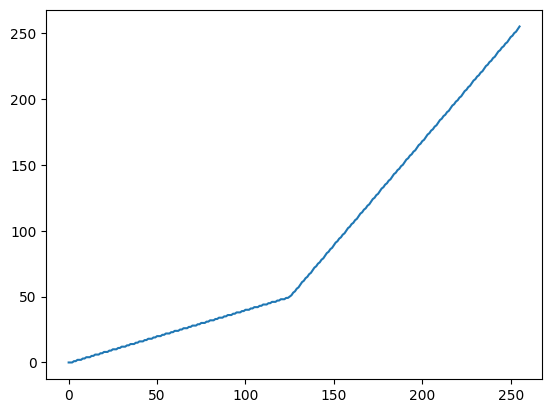

In [10]:
# Create the Function
discontinuities = np.array([(125, 50), (255,255)])

# Segment-wise interpolation
t1 = np.linspace(0, discontinuities[0,1], discontinuities[0,0] + 1 - 0).astype('uint8')
t2 = np.linspace(discontinuities[0,1], discontinuities[1,1], discontinuities[1,0] - discontinuities[0,0] + 1).astype('uint8')

# Concatenate all the segments
white_transform = np.concatenate([t1, t2[1:]])
plt.plot(white_transform)
plt.show()

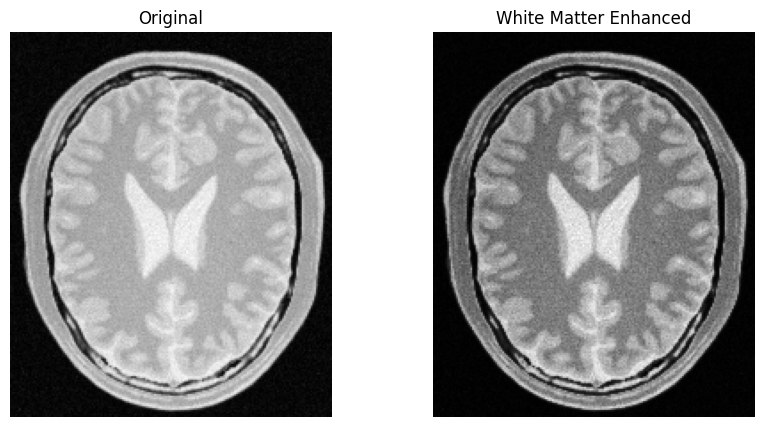

In [11]:
whitematter_enhanced = cv.LUT(brain, white_transform)
plot, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(brain, cmap='gray')
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(whitematter_enhanced, cmap='gray')
axes[1].set_title('White Matter Enhanced')
axes[1].axis(False)
plt.show()

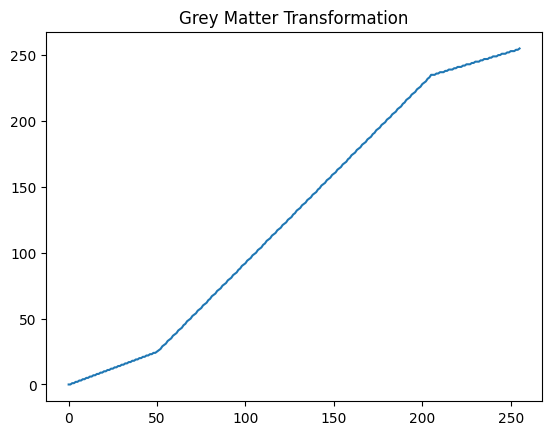

In [12]:
# Create the Function
discontinuities = np.array([(50, 25), (205,235), (255,255)])

# Segment-wise interpolation
t1 = np.linspace(0, discontinuities[0,1], discontinuities[0,0] + 1 - 0).astype('uint8')
t2 = np.linspace(discontinuities[0,1], discontinuities[1,1], discontinuities[1,0] - discontinuities[0,0] + 1).astype('uint8')
t3 = np.linspace(discontinuities[1,1], discontinuities[2,1], discontinuities[2,0] - discontinuities[1,0] + 1).astype('uint8')

# Concatenate all the segments
grey_transform = np.concatenate([t1, t2[1:], t3[1:]])
plt.plot(grey_transform)
plt.title('Grey Matter Transformation')
plt.show()

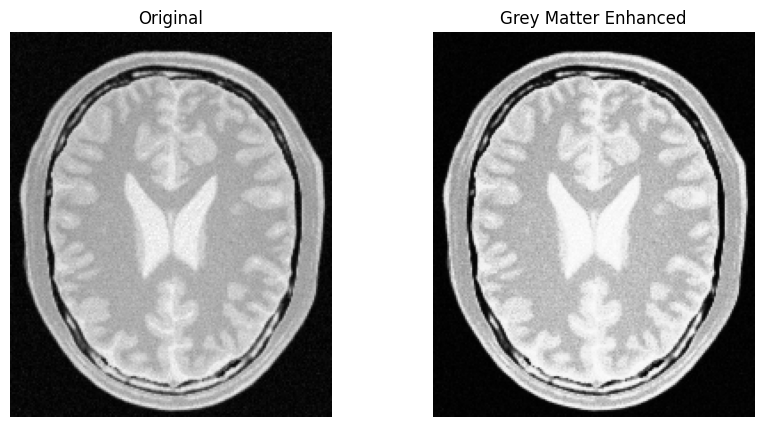

In [13]:
grey_matter_enhanced = cv.LUT(brain, grey_transform)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(brain, cmap='gray')
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(grey_matter_enhanced, cmap='gray')
axes[1].set_title('Grey Matter Enhanced')
axes[1].axis(False)
plt.show()

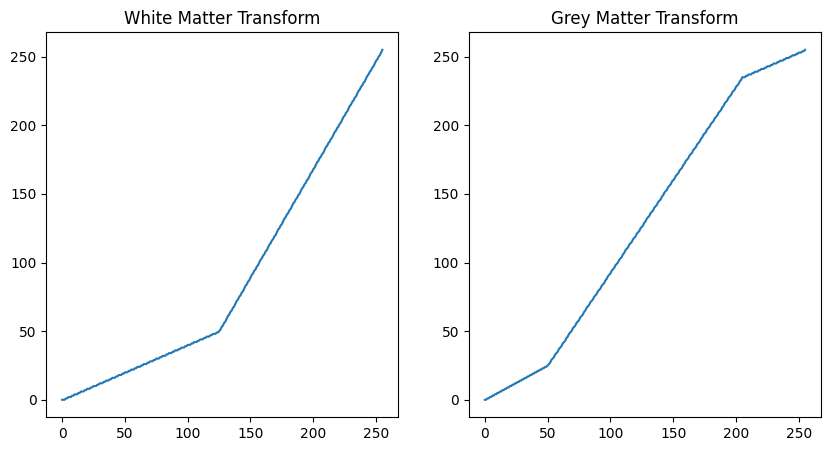

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].plot(white_transform)
axes[0].set_title('White Matter Transform')
axes[1].plot(grey_transform)
axes[1].set_title('Grey Matter Transform')
plt.show()

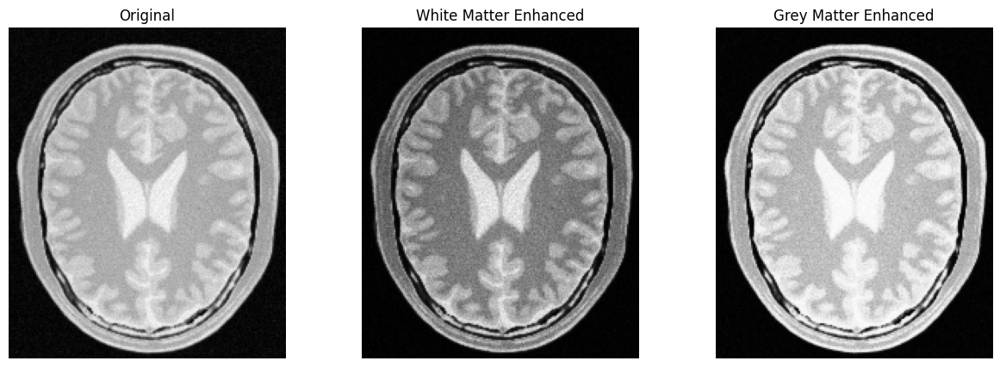

In [15]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(brain, cmap='gray')
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(whitematter_enhanced, cmap='gray')
axes[1].set_title('White Matter Enhanced')
axes[1].axis(False)
axes[2].imshow(grey_matter_enhanced, cmap='gray')
axes[2].set_title('Grey Matter Enhanced')
axes[2].axis(False)
plt.show()

### Gamma Correction

In this section, we consider an image in the L,A,B colour space and gamma correct the L channel. In order to ontain a suitable $\gamma$ value, we will plot the histogram of the L channel and determine a value for $\gamma$

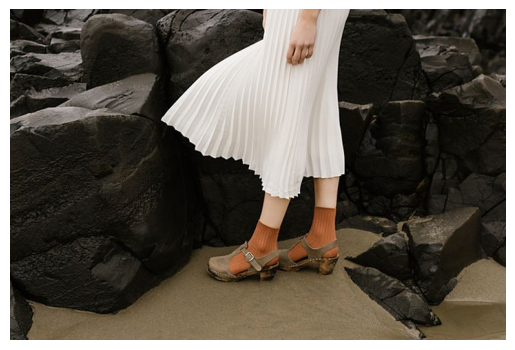

In [16]:
# View the image
gamma_image = ASSET_FOLDER + 'highlights_and_shadows.jpg'
gamma_image = cv.imread(gamma_image)
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

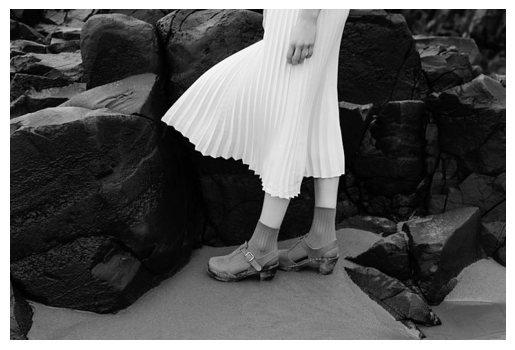

In [17]:
# View the L channel
lab_image = cv.cvtColor(gamma_image, cv.COLOR_BGR2LAB)
l, a, b = cv.split(lab_image)
plt.imshow(l, cmap='gray')
plt.axis(False)
plt.show()

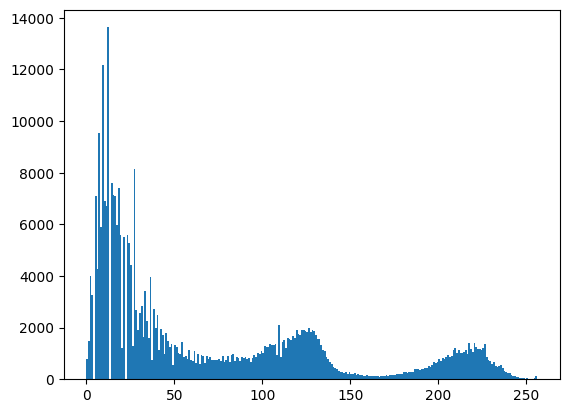

In [18]:
# View the histogram
plt.hist(l.ravel(), bins=256, range=[0, 256])
plt.show()

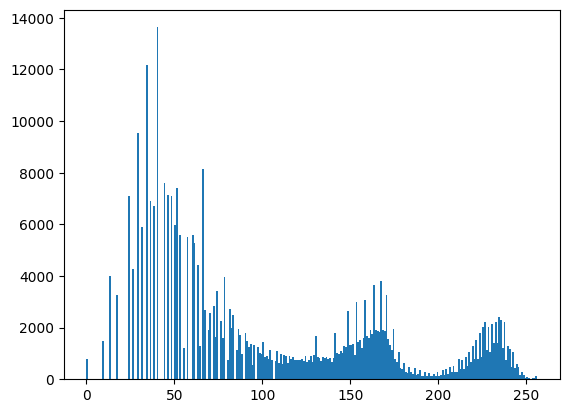

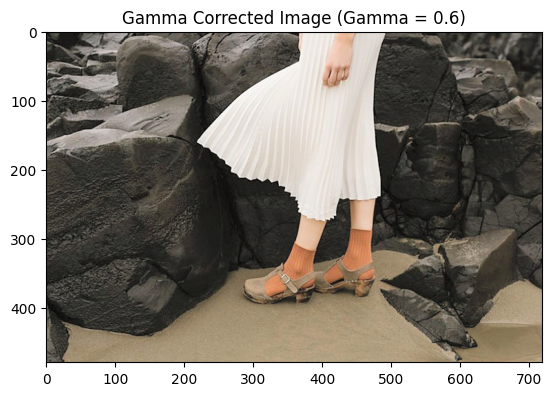

In [19]:
# Since most values of L channel are concentrated in the lower range, we can apply gamma correction to enhance the image such that gamma is less than 1
gamma = 0.6
gamma_transform = np.array([(i / 255.0) ** gamma * 255 for i in np.arange(0,256)], dtype = np.uint8)
l_gamma_corrected = cv.LUT(l, gamma_transform)

# Merge back the corrected L channel with original A and B channels
lab_corrected = cv.merge([l_gamma_corrected, a, b])
plt.hist(l_gamma_corrected.ravel(), bins=256, range=[0, 256])
plt.show()

# Convert back to BGR (or RGB)
image_corrected = cv.cvtColor(lab_corrected, cv.COLOR_LAB2BGR)
plt.imshow(cv.cvtColor(image_corrected, cv.COLOR_BGR2RGB))
plt.title(f'Gamma Corrected Image (Gamma = {gamma})')
plt.show()

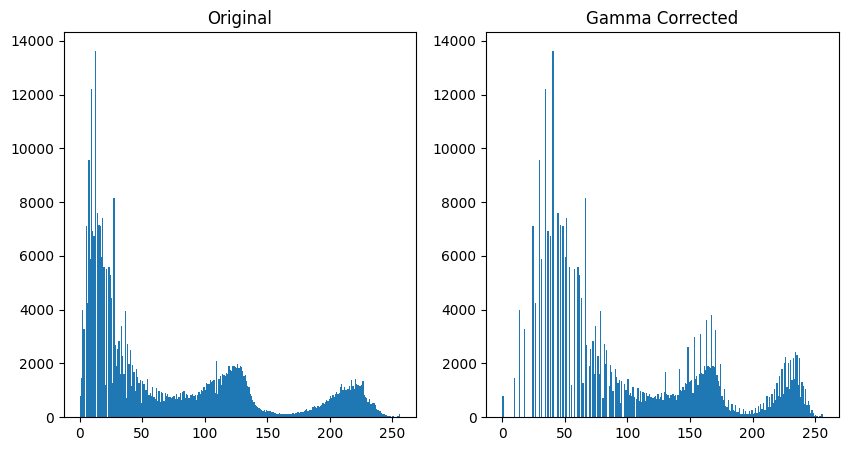

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].hist(l.ravel(), bins=256, range=[0, 256])
axes[0].set_title('Original')
axes[1].hist(l_gamma_corrected.ravel(), bins=256, range=[0, 256])
axes[1].set_title('Gamma Corrected')
plt.show()

### Vibrance Enhancement

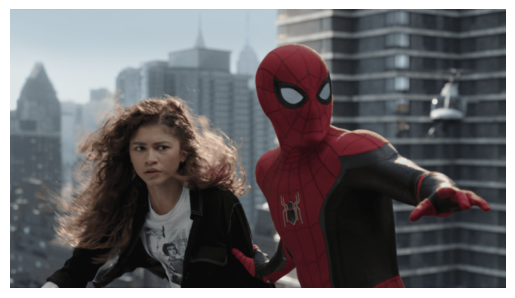

In [21]:
vibrance_image = ASSET_FOLDER + 'spider.png'
vibrance_image = cv.imread(vibrance_image)
plt.imshow(cv.cvtColor(vibrance_image, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

In [22]:
h,s,v = cv.split(cv.cvtColor(vibrance_image, cv.COLOR_BGR2HSV))

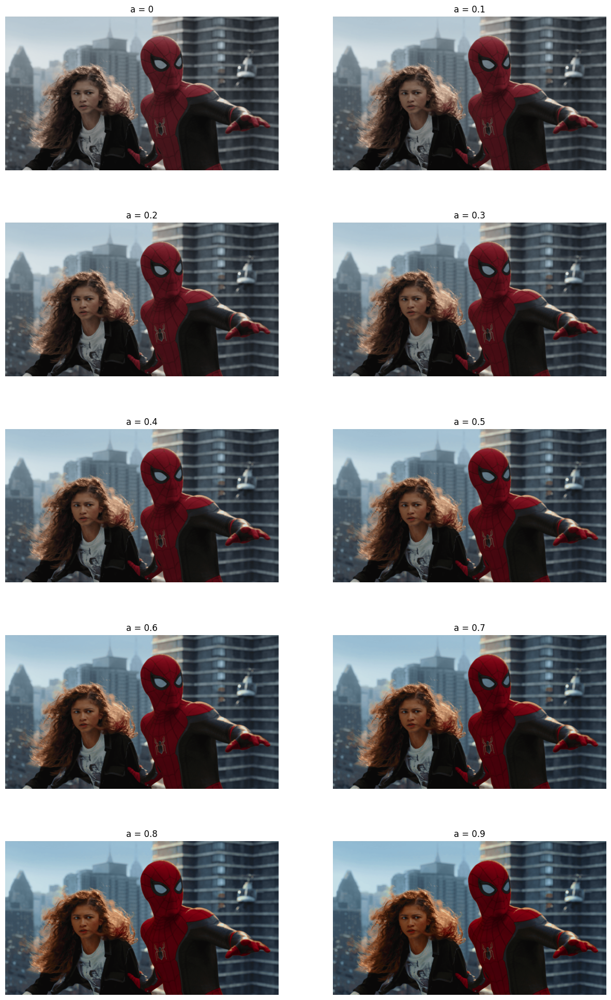

In [23]:
a_values = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0] # a = 0 is the original image
fig, axes = plt.subplots(5, 2, figsize=(15, 25))
for i, ax in enumerate(axes.flatten()):
    vibrance_adjustment = np.array(
        [min(255, x + a_values[i] * 128 * np.exp(-(x - 128)**2 / (2 * 70**2))) for x in np.arange(0, 256)],
        dtype=np.uint8
    )
    s_vibrance = cv.LUT(s, vibrance_adjustment)
    adjusted_image = cv.merge([h, s_vibrance, v])
    ax.imshow(cv.cvtColor(adjusted_image, cv.COLOR_HSV2RGB))
    ax.set_title(f'a = {a_values[i]}')
    ax.axis(False)
plt.show()

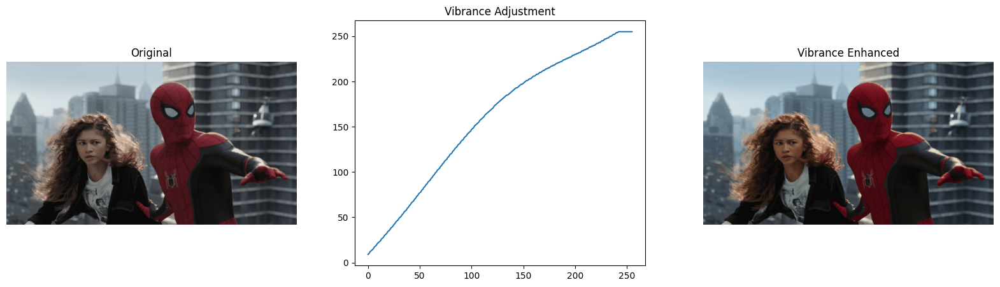

In [24]:
# a = 0.4 seems to be the best value for vibrance enhancement. Let's use this value to enhance the vibrance of the image.
# Note: This is highly subjective and additionally depends on the display used to view the image
a = 0.4
vibrance_adjustment = np.array(
        [min(255, x + a * 128 * np.exp(-(x - 128)**2 / (2 * 70**2))) for x in np.arange(0, 256)],
        dtype=np.uint8
    )

s_vibrance = cv.LUT(s, vibrance_adjustment)
adjusted_image = cv.merge([h, s_vibrance, v])
plot, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(cv.cvtColor(vibrance_image, cv.COLOR_BGR2RGB))
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].plot(vibrance_adjustment)
axes[1].set_title('Vibrance Adjustment')
axes[2].imshow(cv.cvtColor(adjusted_image, cv.COLOR_HSV2RGB))
axes[2].set_title('Vibrance Enhanced')
axes[2].axis(False)
plt.show()


### Histogram Equalization

In [25]:
def histogram_equalization(image):
    M, N = image.shape
    h = cv.calcHist([image], [0], None, [256], [0, 256]).flatten()
    cdf = np.cumsum(h)  # Cumulative Distribution Function
    cdf_normalized = cdf * (255 / cdf[-1])  # Normalize CDF to range [0, 255]
    t = np.uint8(cdf_normalized)  # Convert to uint8
    g = t[image]  # Map the original image through the normalized CDF
    return g

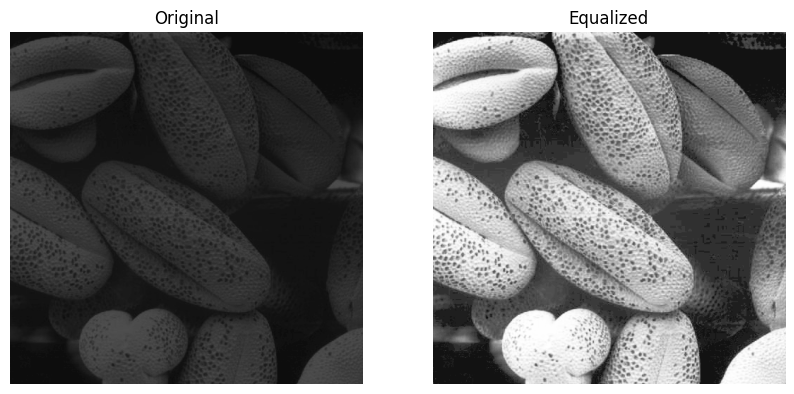

In [26]:
histogram_equalization_image = ASSET_FOLDER + 'shells.tif'
histogram_equalization_image = cv.imread(histogram_equalization_image, cv.IMREAD_GRAYSCALE)
euqalized_image = histogram_equalization(histogram_equalization_image)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(histogram_equalization_image, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(euqalized_image, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('Equalized')
axes[1].axis(False)
plt.show()

### Histogram Equalization on Foreground

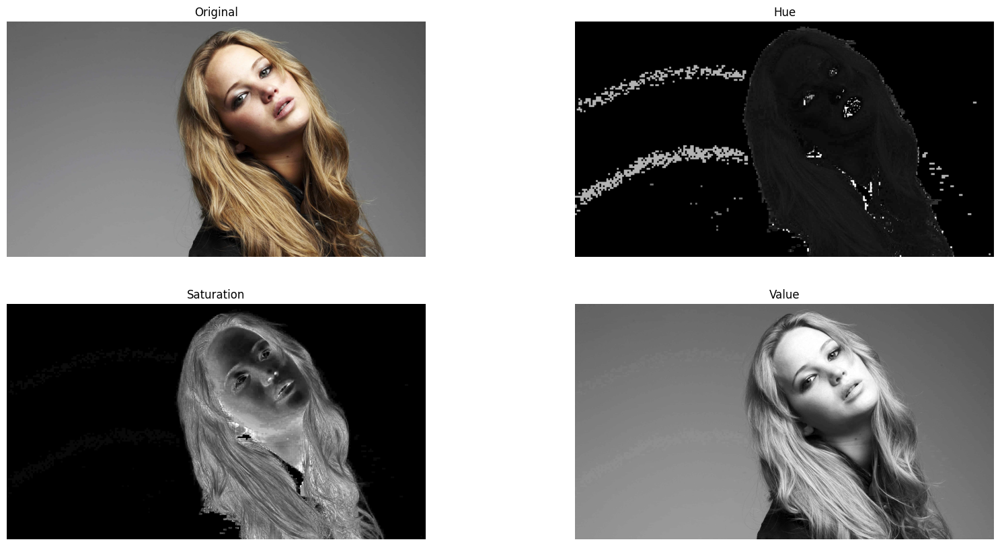

In [27]:
jeniffer = ASSET_FOLDER + 'jeniffer.jpg'
histogram_foreground = cv.imread(jeniffer)
h,s,v = cv.split(cv.cvtColor(histogram_foreground, cv.COLOR_BGR2HSV))
fig, axes = plt.subplots(2,2, figsize=(20, 10))
axes[0,0].imshow(cv.cvtColor(histogram_foreground, cv.COLOR_BGR2RGB))
axes[0,0].set_title('Original')
axes[0,0].axis(False)
axes[0,1].imshow(h, cmap='gray')
axes[0,1].set_title('Hue')
axes[0,1].axis(False)
axes[1,0].imshow(s, cmap='gray')
axes[1,0].set_title('Saturation')
axes[1,0].axis(False)
axes[1,1].imshow(v, cmap='gray')
axes[1,1].set_title('Value')
axes[1,1].axis(False)
plt.show()

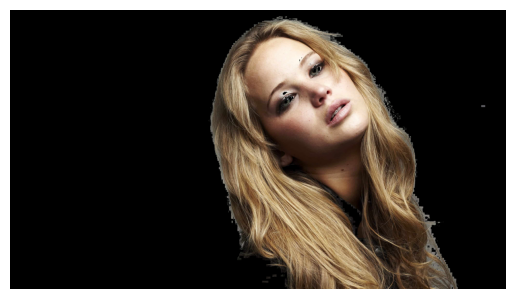

In [28]:
_, binary_mask = cv.threshold(s, 11, 255, cv.THRESH_BINARY)
foreground = cv.bitwise_and(histogram_foreground, histogram_foreground, mask=binary_mask)
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

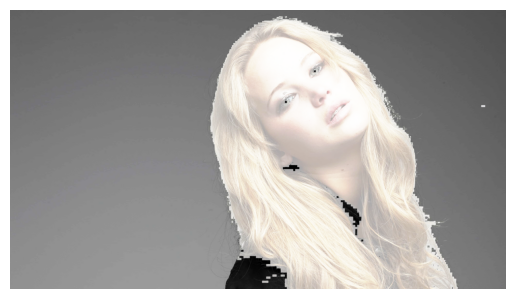

In [29]:
h = cv.calcHist([foreground], [0], None, [256], [0, 256]).flatten()
cdf = np.cumsum(h)
cdf_normalized = cdf * (255 / cdf[-1]) 
t = np.uint8(cdf_normalized) 
equalized_foreground  = t[foreground]
equalized_image = histogram_foreground.copy()

# Step 7: Replace the foreground pixels in the output image with the equalized ones
equalized_image[binary_mask != 0] = equalized_foreground[binary_mask != 0]
plt.imshow(cv.cvtColor(equalized_image, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

### Sobel Filtering

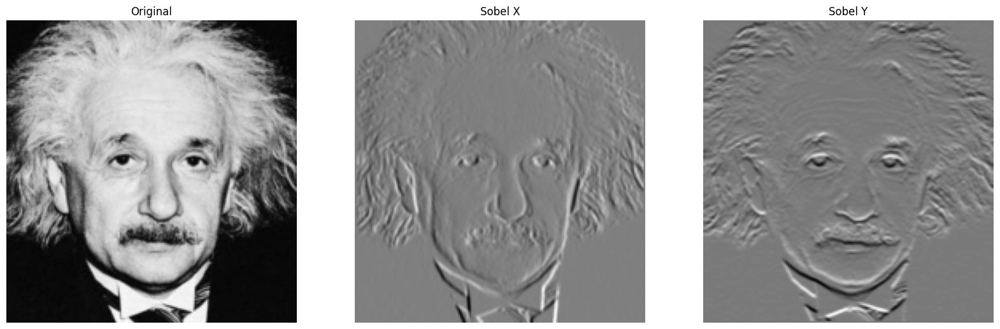

In [30]:
einstein = ASSET_FOLDER + 'einstein.png'
einstein = cv.imread(einstein, cv.IMREAD_REDUCED_GRAYSCALE_2)
sobel_y = np.array([[1, 2, 1], 
                    [0, 0, 0], 
                    [-1, -2, -1]])

sobel_x = np.array([[1, 0, -1],
                    [2, 0, -2],
                    [1, 0, -1]])

sobel_einstein_x = cv.filter2D(einstein, cv.CV_64F, sobel_x)
sobel_einstein_y = cv.filter2D(einstein, cv.CV_64F, sobel_y)
fig, axes = plt.subplots(1, 3, figsize=(20, 10))
axes[0].imshow(einstein, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(sobel_einstein_x, cmap='gray')
axes[1].set_title('Sobel X')
axes[1].axis(False)
axes[2].imshow(sobel_einstein_y, cmap='gray')
axes[2].set_title('Sobel Y')
axes[2].axis(False)
plt.show()

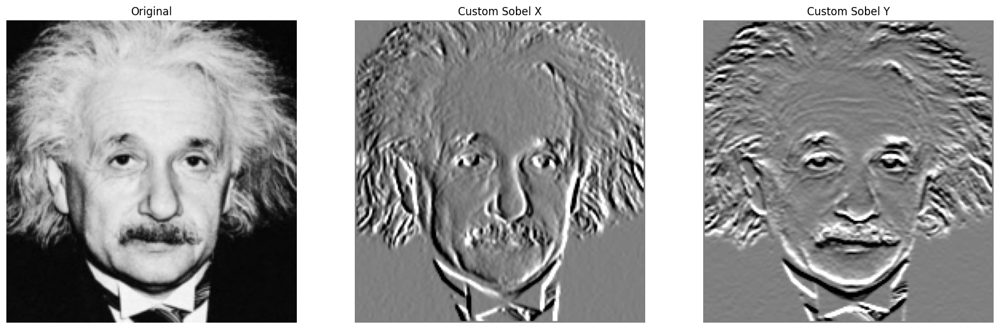

In [31]:
M, N = einstein.shape
einstein = einstein.astype(np.float64)
sobel_einstein_x = np.zeros(shape=(M, N), dtype=np.float64)
sobel_einstein_y = np.zeros(shape=(M, N), dtype=np.float64)

# Custom Sobel filtering
for i in range(1, M-1):
    for j in range(1, N-1):
        sobel_einstein_x[i, j] = einstein[i-1, j-1] - einstein[i-1, j+1] + 2*einstein[i, j-1] - 2*einstein[i, j+1] + einstein[i+1, j-1] - einstein[i+1, j+1]
        sobel_einstein_y[i, j] = einstein[i-1, j-1] + 2*einstein[i-1, j] + einstein[i-1, j+1] - einstein[i+1, j-1] - 2*einstein[i+1, j] - einstein[i+1, j+1] 


# Find the minimum and maximum values in the Sobel filters
sobel_einstein_x = np.clip(sobel_einstein_x, -255, 255)
sobel_einstein_y = np.clip(sobel_einstein_y, -255, 255)

# Step 2: Normalize the gradient values to the range [0, 255]
sobel_einstein_x_normalized = np.uint8(255 * (sobel_einstein_x + 255) / 510)
sobel_einstein_y_normalized = np.uint8(255 * (sobel_einstein_y + 255) / 510)
# Assign the normalized values

fig, axes = plt.subplots(1, 3, figsize=(20, 10))
axes[0].imshow(einstein, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(sobel_einstein_x_normalized, cmap='gray')
axes[1].set_title('Custom Sobel X')
axes[1].axis(False)
axes[2].imshow(sobel_einstein_y_normalized, cmap='gray')
axes[2].set_title('Custom Sobel Y')
axes[2].axis(False)
plt.show()

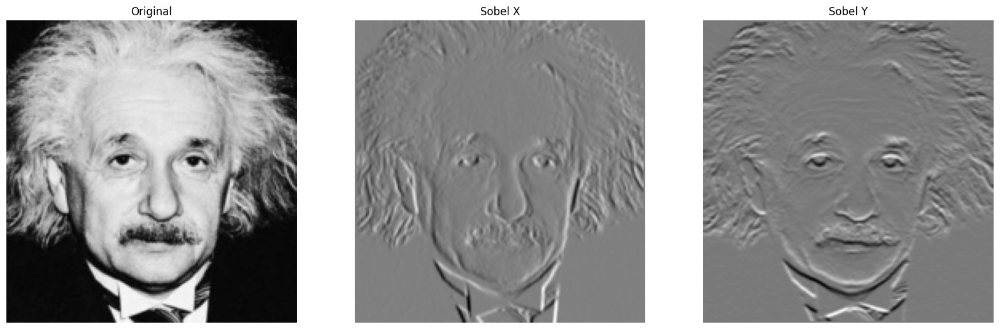

In [32]:
sobel_1 = np.array([1,2,1])
sobel_2 = np.array([1,0,-1])
sobel_einstein_x = cv.sepFilter2D(einstein, -1, sobel_2, sobel_1)
sobel_einstein_y = cv.sepFilter2D(einstein, -1, sobel_1, sobel_2)
fig, axes = plt.subplots(1, 3, figsize=(20, 10))
axes[0].imshow(einstein, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(sobel_einstein_x, cmap='gray')
axes[1].set_title('Sobel X')
axes[1].axis(False)
axes[2].imshow(sobel_einstein_y, cmap='gray')
axes[2].set_title('Sobel Y')
axes[2].axis(False)
plt.show()


### Image upscaling

In [67]:
def upscale_image_nearest_neighbour(image, zoom_factor):
    M, N = image.shape[:2]
    if zoom_factor <= 0 or zoom_factor > 10:
        raise ValueError("Zoom factor must be in the range (0, 10].")
    if len(image.shape) == 3:
        C = image.shape[2]
        zoomed_image = np.zeros((int(M * zoom_factor), int(N * zoom_factor), C), dtype=image.dtype)
    else:
        zoomed_image = np.zeros((int(M * zoom_factor), int(N * zoom_factor)), dtype=image.dtype)
    
    for i in range(zoomed_image.shape[0]):
        for j in range(zoomed_image.shape[1]):
            orig_i = int(i / zoom_factor)
            orig_j = int(j / zoom_factor)
            zoomed_image[i, j] = image[orig_i, orig_j]
    
    return zoomed_image

(270, 480, 3)
(1080, 1920, 3)


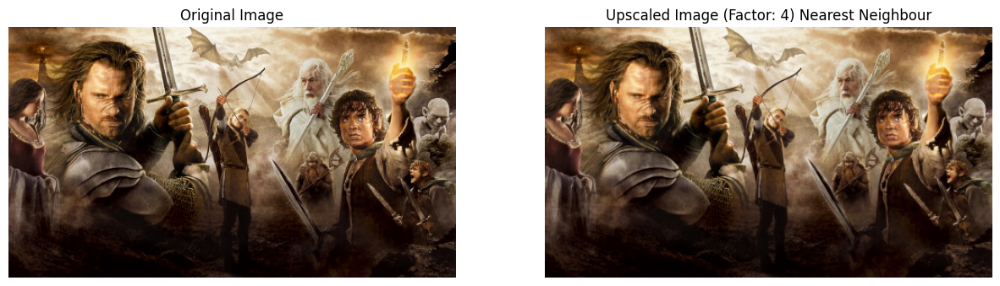

In [82]:
image = ASSET_FOLDER + 'a1q5images/im01small.png'
image = cv.imread(image, cv.IMREAD_COLOR)
zoom_factor = 4 

upscaled_image = upscale_image_nearest_neighbour(image, zoom_factor)

print(image.shape)
print(upscaled_image.shape)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB), cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(cv.cvtColor(upscaled_image,cv.COLOR_BGR2RGB), cmap='gray')
axes[1].set_title(f'Upscaled Image (Factor: {zoom_factor}) Nearest Neighbour')
axes[1].axis('off')
plt.show()

(300, 480, 3)
(1200, 1920, 3)


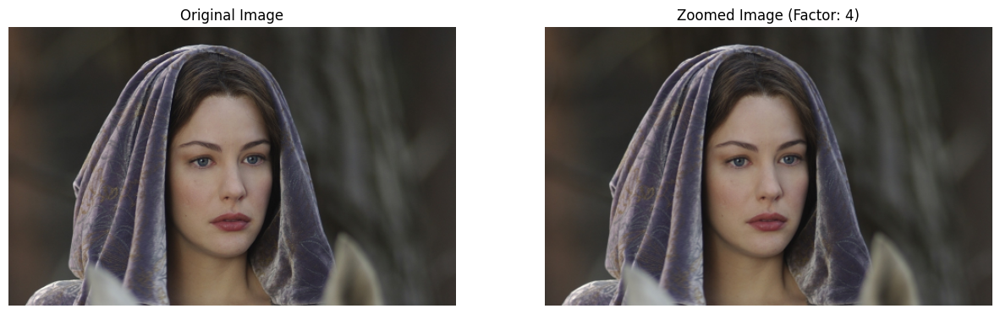

In [83]:
image2 = ASSET_FOLDER + 'a1q5images/im02small.png'
image2 = cv.imread(image2, cv.IMREAD_COLOR)
zoom_factor = 4 
upscaled_image2 = upscale_image_nearest_neighbour(image2, zoom_factor)

print(image2.shape)
print(upscaled_image2.shape)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(cv.cvtColor(image2, cv.COLOR_BGR2RGB), cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(cv.cvtColor(upscaled_image2, cv.COLOR_BGR2RGB), cmap='gray')
axes[1].set_title(f'Zoomed Image (Factor: {zoom_factor})')
axes[1].axis('off')
plt.show()

In [84]:
def upscale_image_bilinear(image, zoom_factor):
    M, N = image.shape[:2]
    if zoom_factor <= 0 or zoom_factor > 10:
        raise ValueError("Zoom factor must be in the range (0, 10].")
    if len(image.shape) == 3:
        C = image.shape[2]  # Number of color channels
        zoomed_image = np.zeros((int(M * zoom_factor), int(N * zoom_factor), C), dtype=np.float64)
    else:
        zoomed_image = np.zeros((int(M * zoom_factor), int(N * zoom_factor)), dtype=np.float64)
    
    for i in range(zoomed_image.shape[0]):
        for j in range(zoomed_image.shape[1]):
            orig_i = i / zoom_factor
            orig_j = j / zoom_factor
            
            i_floor = int(np.floor(orig_i))
            j_floor = int(np.floor(orig_j))
            
            i_ceil = min(i_floor + 1, M - 1)
            j_ceil = min(j_floor + 1, N - 1)
            
            delta_i = orig_i - i_floor
            delta_j = orig_j - j_floor
            
            if len(image.shape) == 3:
                for c in range(C):
                    top_left = image[i_floor, j_floor, c]
                    top_right = image[i_floor, j_ceil, c]
                    bottom_left = image[i_ceil, j_floor, c]
                    bottom_right = image[i_ceil, j_ceil, c]
                    
                    top_interp = (1 - delta_j) * top_left + delta_j * top_right
                    bottom_interp = (1 - delta_j) * bottom_left + delta_j * bottom_right
                    
                    pixel_value = (1 - delta_i) * top_interp + delta_i * bottom_interp
                    
                    zoomed_image[i, j, c] = pixel_value
            else:
                top_left = image[i_floor, j_floor]
                top_right = image[i_floor, j_ceil]
                bottom_left = image[i_ceil, j_floor]
                bottom_right = image[i_ceil, j_ceil]
                
                top_interp = (1 - delta_j) * top_left + delta_j * top_right
                bottom_interp = (1 - delta_j) * bottom_left + delta_j * bottom_right
                
                pixel_value = (1 - delta_i) * top_interp + delta_i * bottom_interp
                
                zoomed_image[i, j] = pixel_value
    
    # Cast back to original dtype if needed
    if image.dtype == np.uint8:
        zoomed_image = np.clip(zoomed_image, 0, 255).astype(np.uint8)
    
    return zoomed_image


(270, 480, 3)
(1080, 1920, 3)


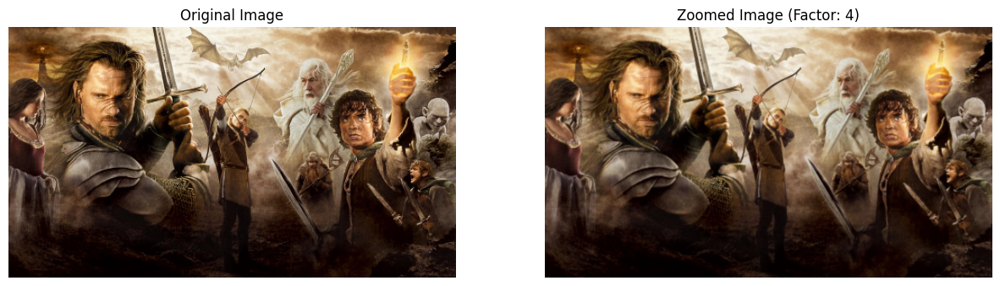

In [85]:
upscaled_image_bilinear = upscale_image_bilinear(image, zoom_factor)
print(image.shape)
print(upscaled_image_bilinear.shape)
# Visualize the original and zoomed images
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB), cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(cv.cvtColor(upscaled_image_bilinear, cv.COLOR_BGR2RGB), cmap='gray')
axes[1].set_title(f'Zoomed Image (Factor: {zoom_factor})')
axes[1].axis('off')
plt.show()

(300, 480, 3)
(1200, 1920, 3)


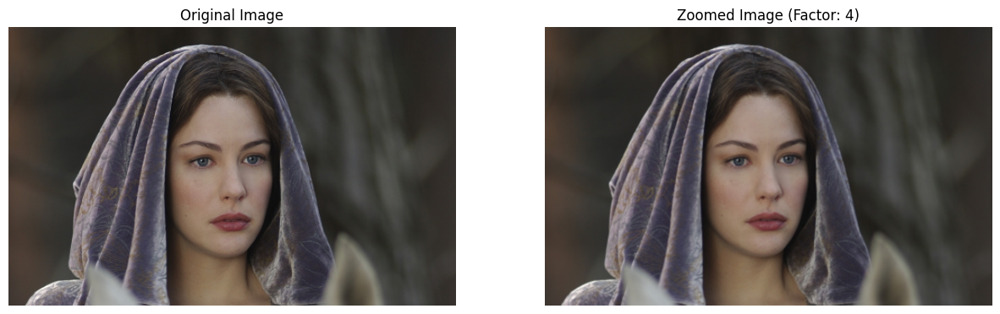

In [86]:
upscaled_image_bilinear2 = upscale_image_bilinear(image2, zoom_factor)
print(image2.shape)
print(upscaled_image_bilinear2.shape)
# Visualize the original and zoomed images
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(cv.cvtColor(image2, cv.COLOR_BGR2RGB), cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(cv.cvtColor(upscaled_image_bilinear2, cv.COLOR_BGR2RGB), cmap='gray')
axes[1].set_title(f'Zoomed Image (Factor: {zoom_factor})')
axes[1].axis('off')
plt.show()

In [89]:
def compute_normalized_ssd(image1, image2):
    diff = (image1.astype(np.float64) - image2.astype(np.float64)) ** 2
    return np.sum(diff) / diff.size


large_image = ASSET_FOLDER + 'a1q5images/im01.png'
large_image2 = ASSET_FOLDER + 'a1q5images/im02.png'
large_image = cv.imread(large_image, cv.IMREAD_COLOR)
large_image2 = cv.imread(large_image2, cv.IMREAD_COLOR)
print("First Example")
print(f"Shape of large image = {large_image.shape}")
print(f"Shape of upscaled image (Nearest Neighbor) = {upscaled_image.shape}")
print(f"Shape of upscaled image (Bilinear) = {upscaled_image_bilinear.shape}")
ssd11 = compute_normalized_ssd(large_image, upscaled_image)
ssd12 = compute_normalized_ssd(large_image, upscaled_image_bilinear)
print(f"SSD (Nearest Neighbor): {ssd11:.2f}")
print(f"SSD (Bilinear): {ssd12:.2f}")

print("\nSecond Example")
print(f"Shape of large image = {large_image2.shape}")
print(f"Shape of upscaled image (Nearest Neighbor) = {upscaled_image2.shape}")
print(f"Shape of upscaled image (Bilinear) = {upscaled_image_bilinear2.shape}")
ssd21 = compute_normalized_ssd(large_image2, upscaled_image2)
ssd22 = compute_normalized_ssd(large_image2, upscaled_image_bilinear2)
print(f"SSD (Nearest Neighbor): {ssd21:.2f}")
print(f"SSD (Bilinear): {ssd22:.2f}")

First Example
Shape of large image = (1080, 1920, 3)
Shape of upscaled image (Nearest Neighbor) = (1080, 1920, 3)
Shape of upscaled image (Bilinear) = (1080, 1920, 3)
SSD (Nearest Neighbor): 136.27
SSD (Bilinear): 200.25

Second Example
Shape of large image = (1200, 1920, 3)
Shape of upscaled image (Nearest Neighbor) = (1200, 1920, 3)
Shape of upscaled image (Bilinear) = (1200, 1920, 3)
SSD (Nearest Neighbor): 26.45
SSD (Bilinear): 48.96


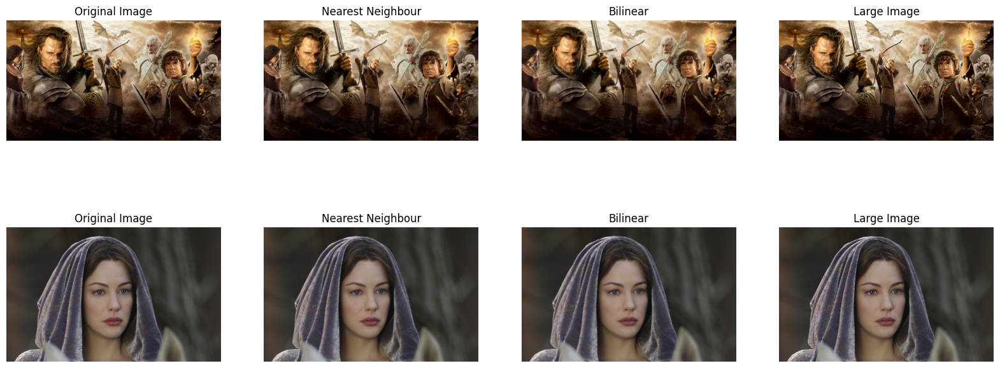

In [96]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
axes[0, 0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Image')
axes[0, 0].axis(False)
axes[0, 1].imshow(cv.cvtColor(upscaled_image, cv.COLOR_BGR2RGB))
axes[0, 1].set_title('Nearest Neighbour')
axes[0, 1].axis(False)
axes[0, 2].imshow(cv.cvtColor(upscaled_image_bilinear, cv.COLOR_BGR2RGB))
axes[0, 2].set_title('Bilinear')
axes[0, 2].axis(False)
axes[0, 3].imshow(cv.cvtColor(large_image, cv.COLOR_BGR2RGB))
axes[0, 3].set_title('Large Image')
axes[0, 3].axis(False)
axes[1, 0].imshow(cv.cvtColor(image2, cv.COLOR_BGR2RGB))
axes[1, 0].set_title('Original Image')
axes[1, 0].axis(False)
axes[1, 1].imshow(cv.cvtColor(upscaled_image2, cv.COLOR_BGR2RGB))
axes[1, 1].set_title('Nearest Neighbour')
axes[1, 1].axis(False)
axes[1, 2].imshow(cv.cvtColor(upscaled_image_bilinear2, cv.COLOR_BGR2RGB))
axes[1, 2].set_title('Bilinear')
axes[1, 2].axis(False)
axes[1, 3].imshow(cv.cvtColor(large_image2, cv.COLOR_BGR2RGB))
axes[1, 3].set_title('Large Image')
axes[1, 3].axis(False)
plt.show()

### Image Enhancement

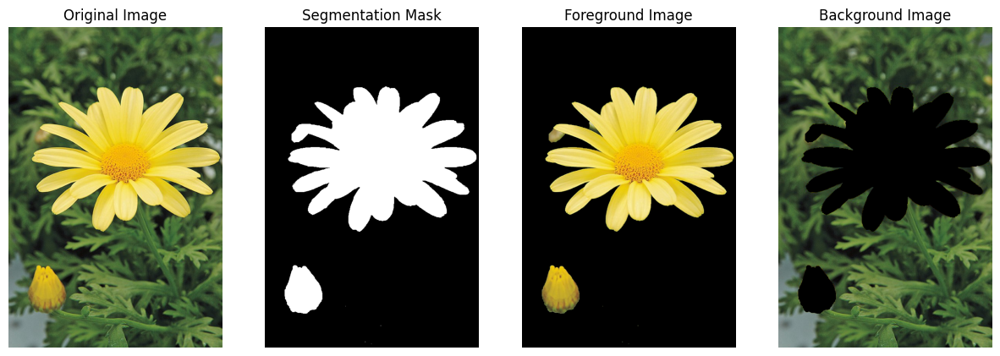

In [101]:
flower = ASSET_FOLDER + 'daisy.jpg'
flower = cv.imread(flower, cv.IMREAD_COLOR)

mask = np.zeros(flower.shape[:2], np.uint8)
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)
rect = (50, 50, flower.shape[1] - 50, flower.shape[0] - 50)
cv.grabCut(flower, mask, rect, bgd_model, fgd_model, 5, cv.GC_INIT_WITH_RECT)
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
foreground = flower * mask2[:, :, np.newaxis]
background = flower * (1 - mask2)[:, :, np.newaxis]


fig, axes = plt.subplots(1, 4, figsize=(15, 5))
axes[0].imshow(cv.cvtColor(flower, cv.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(mask2, cmap='gray')
axes[1].set_title('Segmentation Mask')
axes[1].axis('off')
axes[2].imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
axes[2].set_title('Foreground Image')
axes[2].axis('off')
axes[3].imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
axes[3].set_title('Background Image')
axes[3].axis('off')
plt.show()

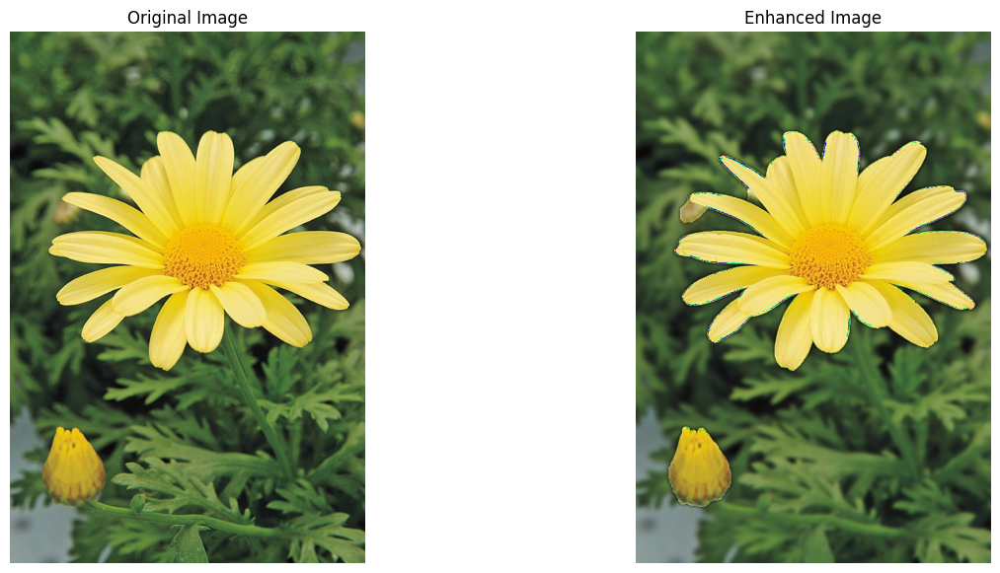

In [107]:
blurred_background = cv.GaussianBlur(background, (15, 15), 0)
enhanced_image = blurred_background + foreground
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(cv.cvtColor(flower, cv.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(cv.cvtColor(enhanced_image, cv.COLOR_BGR2RGB))
axes[1].set_title('Enhanced Image')
axes[1].axis('off')
plt.show()


When the mask is created, some pixels around the edges of the foreground object might be classified as probable background (label 2) or definite background (label 0). These pixels are set to zero in the mask, which results in dark pixels when the background is blurred and combined with the foreground.